In [4]:
! gdown "10fcHVYWhCFyVTxZIoI_O7q4PnfbClnOD"

Downloading...
From: https://drive.google.com/uc?id=10fcHVYWhCFyVTxZIoI_O7q4PnfbClnOD
To: /content/Faces.zip
100% 7.53M/7.53M [00:00<00:00, 17.5MB/s]


In [5]:
!unzip "/content/Faces.zip"

Archive:  /content/Faces.zip
replace Faces/Alexandra Daddario/Alexandra Daddario_0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [7]:
!pip install facenet-pytorch

In [1]:
import torch
print(torch.__version__)

2.2.1+cu121


In [2]:
import os
import cv2
import torch
import numpy as np
from tqdm import tqdm
import torch.nn as nn
from PIL import Image
import torch.optim as optim
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from torchvision import transforms, datasets
from torchvision.transforms import ToTensor
from facenet_pytorch import InceptionResnetV1
from torch.utils.data import DataLoader, Dataset, random_split

# Load Data

In [3]:

transform = transforms.Compose([
     # Resize the image to 224x224 pixels
    transforms.ToTensor(),           # Convert the image to a PyTorch tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize the image
])

class CustomDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label = self.labels[idx]


        image = cv2.imread(image_path)

        # Apply transformations if provided
        if self.transform:
            image = self.transform(image)

        return image, label

root_dir = '/content/Faces'
valid_image_paths = []
valid_labels = []

# Iterate through each class directory
for class_name in os.listdir(root_dir):
    class_dir = os.path.join(root_dir, class_name)
    # Iterate through each image in the class directory
    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        # Append the image path and label to the lists
        valid_image_paths.append(image_path)
        valid_labels.append(class_name)  # Use class name as label directly

# Convert class names (labels) to numerical labels
label_to_idx = {label: idx for idx, label in enumerate(set(valid_labels))}
numerical_labels = [label_to_idx[label] for label in valid_labels]

# Create a dataset from the valid image paths and numerical labels
dataset = CustomDataset(valid_image_paths, numerical_labels, transform=transform)

# Print the number of samples in the dataset
print("Number of samples in the dataset:", len(dataset))

# Create a DataLoader to iterate over batches of data
batch_size = 32
train_size = int(0.8 * len(dataset))  # 80% of the data for training
test_size = len(dataset) - train_size  # Remaining 20% for testing

# Split the dataset into train and test sets
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# Create DataLoadersa for train and test sets
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Number of samples in the dataset: 1451


# Face Classifier

# Model 1

In [ ]:
class CustomModel(nn.Module):
    def __init__(self, num_classes, embedding_size=512, hidden_size=256):
        super(CustomModel, self).__init__()

        # Pre-trained FaceNet model
        self.facenet = InceptionResnetV1(pretrained='vggface2').eval()

        # Freeze parameters of the FaceNet model
        for param in self.facenet.parameters():
            param.requires_grad = False

        # MLP layers
        self.fc1 = nn.Linear(embedding_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        # Extract embeddings using FaceNet
        embeddings = self.facenet(x)

        # Pass embeddings through MLP
        x = self.fc1(embeddings)
        x = self.relu(x)
        x = self.fc2(x)

        return x

# Define the number of classes
num_classes = 14

# Create an instance of the custom model
custom_model = CustomModel(num_classes)

# Print the model architecture
print(custom_model)


  0%|          | 0.00/107M [00:00<?, ?B/s]

CustomModel(
  (facenet): InceptionResnetV1(
    (conv2d_1a): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2a): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2b): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2d_3b): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, 

In [ ]:
transform = transforms.Compose([
 #  # Resize the image to 224x224 pixels
    transforms.ToTensor(),           # Convert the image to a PyTorch tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize the image
])
num_epochs = 10
learning_rate = 0.001
correct_predictions = 0
total_samples = 0


num_classes = 14
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
custom_model = CustomModel(num_classes)
custom_model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(custom_model.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    custom_model.train()  # Set the model to training mode
    running_loss = 0.0

    # Iterate over the training dataset
    for images, labels in tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch'):
        # Zero the gradients
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        # Forward pass
        outputs = custom_model(images)

        # Calculate loss
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Update running loss
        running_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

    # Calculate accuracy
    accuracy = correct_predictions / total_samples
    print(f'Training Accuracy: {accuracy * 100:.2f}%')

    # Calculate average training loss for the epoch
    epoch_loss = running_loss / len(train_dataset)
    print(f'Training Loss: {epoch_loss:.4f}')

Epoch 1/10: 100%|██████████| 37/37 [00:04<00:00,  8.16batch/s]


Training Accuracy: 82.84%
Training Loss: 2.3262


Epoch 2/10: 100%|██████████| 37/37 [00:02<00:00, 15.09batch/s]


Training Accuracy: 90.82%
Training Loss: 1.1211


Epoch 3/10: 100%|██████████| 37/37 [00:02<00:00, 15.18batch/s]


Training Accuracy: 93.51%
Training Loss: 0.2992


Epoch 4/10: 100%|██████████| 37/37 [00:02<00:00, 14.97batch/s]


Training Accuracy: 95.04%
Training Loss: 0.1268


Epoch 5/10: 100%|██████████| 37/37 [00:02<00:00, 13.37batch/s]


Training Accuracy: 95.93%
Training Loss: 0.0871


Epoch 6/10: 100%|██████████| 37/37 [00:02<00:00, 13.67batch/s]


Training Accuracy: 96.54%
Training Loss: 0.0582


Epoch 7/10: 100%|██████████| 37/37 [00:02<00:00, 14.67batch/s]


Training Accuracy: 96.98%
Training Loss: 0.0453


Epoch 8/10: 100%|██████████| 37/37 [00:02<00:00, 13.88batch/s]


Training Accuracy: 97.32%
Training Loss: 0.0375


Epoch 9/10: 100%|██████████| 37/37 [00:02<00:00, 15.05batch/s]


Training Accuracy: 97.60%
Training Loss: 0.0317


Epoch 10/10: 100%|██████████| 37/37 [00:03<00:00,  9.79batch/s]

Training Accuracy: 97.78%
Training Loss: 0.0325


In [ ]:
# Test loop
custom_model.eval()  # Set the model to evaluation mode
correct_predictions = 0
total_samples = 0

# Disable gradient calculation during testing
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc=f'Testing'):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = custom_model(images)

        # Get predicted labels
        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

# Calculate accuracy
accuracy = correct_predictions / total_samples
print(f'Test Accuracy: {accuracy * 100:.2f}%')


Testing: 100%|██████████| 10/10 [00:00<00:00, 12.67it/s]

Test Accuracy: 97.25%


# Model 2

In [11]:
class CustomModel1(nn.Module):
    def __init__(self, num_classes, embedding_size=512, hidden_size=256, dropout_p=0.5):
        super(CustomModel1, self).__init__()

        # Pre-trained FaceNet model
        self.facenet = InceptionResnetV1(pretrained='vggface2').eval()

        # Freeze parameters of the FaceNet model
        for param in self.facenet.parameters():
            param.requires_grad = False

        # MLP layers
        self.fc1 = nn.Linear(embedding_size, hidden_size)
        self.dropout1 = nn.Dropout(dropout_p)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        # Extract embeddings using FaceNet
        embeddings = self.facenet(x)

        # Pass embeddings through MLP
        x = self.fc1(embeddings)
        x = self.dropout1(x)
        x = self.relu(x)
        x = self.fc2(x)

        return x, embeddings

# Define the number of classes and dropout probability
num_classes = 14
dropout_p = 0.25

# Create an instance of the custom model
custom_model1 = CustomModel1(num_classes, dropout_p=dropout_p)

# Print the model architecture
print(custom_model1)


CustomModel1(
  (facenet): InceptionResnetV1(
    (conv2d_1a): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2a): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2b): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2d_3b): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True,

In [12]:
transform = transforms.Compose([
 #  # Resize the image to 224x224 pixels
    transforms.ToTensor(),           # Convert the image to a PyTorch tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize the image
])
num_epochs = 18
learning_rate = 0.001
correct_predictions = 0
total_samples = 0


num_classes = 14
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
custom_model1 = CustomModel1(num_classes)
custom_model1.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(custom_model1.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    custom_model1.train()  # Set the model to training mode
    running_loss = 0.0

    # Iterate over the training dataset
    for images, labels in tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch'):
        # Zero the gradients
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        # Forward pass
        outputs, _ = custom_model1(images)

        # Calculate loss
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Update running loss
        running_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

    # Calculate accuracy
    accuracy = correct_predictions / total_samples
    print(f'Training Accuracy: {accuracy * 100:.2f}%')

    # Calculate average training loss for the epoch
    epoch_loss = running_loss / len(train_dataset)
    print(f'Training Loss: {epoch_loss:.4f}')

Epoch 1/18: 100%|██████████| 37/37 [00:02<00:00, 14.64batch/s]


Training Accuracy: 76.29%
Training Loss: 2.3846


Epoch 2/18: 100%|██████████| 37/37 [00:02<00:00, 15.18batch/s]


Training Accuracy: 87.07%
Training Loss: 1.3939


Epoch 3/18: 100%|██████████| 37/37 [00:02<00:00, 13.75batch/s]


Training Accuracy: 90.78%
Training Loss: 0.5070


Epoch 4/18: 100%|██████████| 37/37 [00:05<00:00,  6.81batch/s]


Training Accuracy: 92.84%
Training Loss: 0.2249


Epoch 5/18: 100%|██████████| 37/37 [00:02<00:00, 15.30batch/s]


Training Accuracy: 93.98%
Training Loss: 0.1441


Epoch 6/18: 100%|██████████| 37/37 [00:02<00:00, 15.21batch/s]


Training Accuracy: 94.84%
Training Loss: 0.1067


Epoch 7/18: 100%|██████████| 37/37 [00:02<00:00, 15.17batch/s]


Training Accuracy: 95.41%
Training Loss: 0.0895


Epoch 8/18: 100%|██████████| 37/37 [00:02<00:00, 14.81batch/s]


Training Accuracy: 95.84%
Training Loss: 0.0735


Epoch 9/18: 100%|██████████| 37/37 [00:02<00:00, 12.76batch/s]


Training Accuracy: 96.20%
Training Loss: 0.0634


Epoch 10/18: 100%|██████████| 37/37 [00:02<00:00, 14.98batch/s]


Training Accuracy: 96.45%
Training Loss: 0.0603


Epoch 11/18: 100%|██████████| 37/37 [00:02<00:00, 14.95batch/s]


Training Accuracy: 96.69%
Training Loss: 0.0522


Epoch 12/18: 100%|██████████| 37/37 [00:02<00:00, 14.91batch/s]


Training Accuracy: 96.87%
Training Loss: 0.0504


Epoch 13/18: 100%|██████████| 37/37 [00:02<00:00, 14.79batch/s]


Training Accuracy: 97.04%
Training Loss: 0.0421


Epoch 14/18: 100%|██████████| 37/37 [00:02<00:00, 13.06batch/s]


Training Accuracy: 97.20%
Training Loss: 0.0409


Epoch 15/18: 100%|██████████| 37/37 [00:02<00:00, 15.21batch/s]


Training Accuracy: 97.32%
Training Loss: 0.0415


Epoch 16/18: 100%|██████████| 37/37 [00:02<00:00, 15.01batch/s]


Training Accuracy: 97.46%
Training Loss: 0.0319


Epoch 17/18: 100%|██████████| 37/37 [00:02<00:00, 15.18batch/s]


Training Accuracy: 97.58%
Training Loss: 0.0286


Epoch 18/18: 100%|██████████| 37/37 [00:02<00:00, 14.13batch/s]

Training Accuracy: 97.70%
Training Loss: 0.0270


In [13]:
# Test loop
custom_model1.eval()  # Set the model to evaluation mode
correct_predictions = 0
total_samples = 0

# Disable gradient calculation during testing
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc=f'Testing'):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs, _ = custom_model1(images)

        # Get predicted labels
        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

# Calculate accuracy
accuracy = correct_predictions / total_samples
print(f'Test Accuracy: {accuracy * 100:.2f}%')


Testing: 100%|██████████| 10/10 [00:00<00:00, 16.27it/s]

Test Accuracy: 99.66%


# Model 3

In [4]:
class CustomModel2(nn.Module):
    def __init__(self, num_classes, embedding_size=512, hidden_size=128):
        super(CustomModel2, self).__init__()

        # Pre-trained FaceNet model
        self.facenet = InceptionResnetV1(pretrained='vggface2').eval()

        # Freeze parameters of the FaceNet model
        for param in self.facenet.parameters():
            param.requires_grad = False

        # MLP layers
        self.fc1 = nn.Linear(embedding_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        # Extract embeddings using FaceNet
        embeddings = self.facenet(x)

        # Pass embeddings through MLP
        x = self.fc1(embeddings)
        x = self.relu(x)
        x = self.fc2(x)

        return x

# Define the number of classes
num_classes = 14

# Create an instance of the custom model
custom_model2 = CustomModel2(num_classes)

# Print the model architecture
print(custom_model2)


  0%|          | 0.00/107M [00:00<?, ?B/s]

CustomModel2(
  (facenet): InceptionResnetV1(
    (conv2d_1a): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2a): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2b): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2d_3b): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True,

In [5]:
transform = transforms.Compose([
 #  # Resize the image to 224x224 pixels
    transforms.ToTensor(),           # Convert the image to a PyTorch tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize the image
])
num_epochs = 10
learning_rate = 0.001
correct_predictions = 0
total_samples = 0


num_classes = 14
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
custom_model2 = CustomModel2(num_classes)
custom_model2.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(custom_model2.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    custom_model2.train()  # Set the model to training mode
    running_loss = 0.0

    # Iterate over the training dataset
    for images, labels in tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch'):
        # Zero the gradients
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        # Forward pass
        outputs = custom_model2(images)

        # Calculate loss
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Update running loss
        running_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

    # Calculate accuracy
    accuracy = correct_predictions / total_samples
    print(f'Training Accuracy: {accuracy * 100:.2f}%')

    # Calculate average training loss for the epoch
    epoch_loss = running_loss / len(train_dataset)
    print(f'Training Loss: {epoch_loss:.4f}')

Epoch 1/10: 100%|██████████| 37/37 [00:04<00:00,  9.07batch/s]


Training Accuracy: 59.66%
Training Loss: 2.4387


Epoch 2/10: 100%|██████████| 37/37 [00:02<00:00, 15.15batch/s]


Training Accuracy: 77.76%
Training Loss: 1.6251


Epoch 3/10: 100%|██████████| 37/37 [00:02<00:00, 15.30batch/s]


Training Accuracy: 84.68%
Training Loss: 0.7091


Epoch 4/10: 100%|██████████| 37/37 [00:02<00:00, 12.95batch/s]


Training Accuracy: 88.23%
Training Loss: 0.3006


Epoch 5/10: 100%|██████████| 37/37 [00:02<00:00, 14.22batch/s]


Training Accuracy: 90.43%
Training Loss: 0.1692


Epoch 6/10: 100%|██████████| 37/37 [00:02<00:00, 15.01batch/s]


Training Accuracy: 91.88%
Training Loss: 0.1215


Epoch 7/10: 100%|██████████| 37/37 [00:02<00:00, 15.27batch/s]


Training Accuracy: 92.91%
Training Loss: 0.0939


Epoch 8/10: 100%|██████████| 37/37 [00:02<00:00, 14.98batch/s]


Training Accuracy: 93.71%
Training Loss: 0.0681


Epoch 9/10: 100%|██████████| 37/37 [00:02<00:00, 13.09batch/s]


Training Accuracy: 94.35%
Training Loss: 0.0636


Epoch 10/10: 100%|██████████| 37/37 [00:02<00:00, 15.27batch/s]

Training Accuracy: 94.85%
Training Loss: 0.0566


In [6]:
# Test loop
custom_model2.eval()  # Set the model to evaluation mode
correct_predictions = 0
total_samples = 0

# Disable gradient calculation during testing
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc=f'Testing'):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = custom_model2(images)

        # Get predicted labels
        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

# Calculate accuracy
accuracy = correct_predictions / total_samples
print(f'Test Accuracy: {accuracy * 100:.2f}%')


Testing: 100%|██████████| 10/10 [00:00<00:00, 13.23it/s]

Test Accuracy: 96.22%


# Model 4

In [ ]:
class CustomModelFinetune(nn.Module):
    def __init__(self, num_classes, embedding_size=512, hidden_size=256):
        super(CustomModelFinetune, self).__init__()

        # Pre-trained FaceNet model
        self.facenet = InceptionResnetV1(pretrained='vggface2').eval()

        # Freeze parameters of all layers except the last two
        for name, param in self.facenet.named_parameters():
            if not name.startswith('last_linear') and not name.startswith('logits'):
                param.requires_grad = False

        # MLP layers
        self.fc1 = nn.Linear(embedding_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        # Extract embeddings using FaceNet
        embeddings = self.facenet(x)

        # Pass embeddings through MLP
        x = self.fc1(embeddings)
        x = self.relu(x)
        x = self.fc2(x)

        return x, embeddings

# Define the number of classes
num_classes = 14

# Create an instance of the custom model
customModel_Finetune = CustomModelFinetune(num_classes)

# Print the model architecture
print(customModel_Finetune)

# Check if parameters are frozen
for name, param in customModel_Finetune.facenet.named_parameters():
    print(name, param.requires_grad)

  0%|          | 0.00/107M [00:00<?, ?B/s]

CustomModelFinetune(
  (facenet): InceptionResnetV1(
    (conv2d_1a): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2a): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2b): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2d_3b): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affin

In [ ]:
transform = transforms.Compose([
 #  # Resize the image to 224x224 pixels
    transforms.ToTensor(),           # Convert the image to a PyTorch tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize the image
])
num_epochs = 10
learning_rate = 0.001
correct_predictions = 0
total_samples = 0


num_classes = 14
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
customModel_Finetune = CustomModelFinetune(num_classes)
customModel_Finetune.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(customModel_Finetune.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    customModel_Finetune.train()  # Set the model to training mode
    running_loss = 0.0

    # Iterate over the training dataset
    for images, labels in tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch'):
        # Zero the gradients
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        # Forward pass
        outputs, _ = customModel_Finetune(images)

        # Calculate loss
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Update running loss
        running_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

    # Calculate accuracy
    accuracy = correct_predictions / total_samples
    print(f'Training Accuracy: {accuracy * 100:.2f}%')

    # Calculate average training loss for the epoch
    epoch_loss = running_loss / len(train_dataset)
    print(f'Training Loss: {epoch_loss:.4f}')

Epoch 1/10: 100%|██████████| 37/37 [00:07<00:00,  4.77batch/s]


Training Accuracy: 83.36%
Training Loss: 2.1463


Epoch 2/10: 100%|██████████| 37/37 [00:04<00:00,  8.15batch/s]


Training Accuracy: 90.47%
Training Loss: 0.7516


Epoch 3/10: 100%|██████████| 37/37 [00:06<00:00,  5.63batch/s]


Training Accuracy: 93.30%
Training Loss: 0.1773


Epoch 4/10: 100%|██████████| 37/37 [00:03<00:00, 10.32batch/s]


Training Accuracy: 94.72%
Training Loss: 0.1019


Epoch 5/10: 100%|██████████| 37/37 [00:02<00:00, 14.57batch/s]


Training Accuracy: 95.64%
Training Loss: 0.0686


Epoch 6/10: 100%|██████████| 37/37 [00:02<00:00, 14.62batch/s]


Training Accuracy: 96.31%
Training Loss: 0.0379


Epoch 7/10: 100%|██████████| 37/37 [00:03<00:00, 12.14batch/s]


Training Accuracy: 96.77%
Training Loss: 0.0315


Epoch 8/10: 100%|██████████| 37/37 [00:02<00:00, 14.46batch/s]


Training Accuracy: 97.09%
Training Loss: 0.0327


Epoch 9/10: 100%|██████████| 37/37 [00:02<00:00, 14.74batch/s]


Training Accuracy: 97.38%
Training Loss: 0.0223


Epoch 10/10: 100%|██████████| 37/37 [00:02<00:00, 14.61batch/s]

Training Accuracy: 97.60%
Training Loss: 0.0204


In [ ]:
# Test loop
customModel_Finetune.eval()  # Set the model to evaluation mode
correct_predictions = 0
total_samples = 0

# Disable gradient calculation during testing
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc=f'Testing'):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs, _ = customModel_Finetune(images)

        # Get predicted labels
        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

# Calculate accuracy
accuracy = correct_predictions / total_samples
print(f'Test Accuracy: {accuracy * 100:.2f}%')


Testing: 100%|██████████| 10/10 [00:00<00:00, 14.51it/s]

Test Accuracy: 99.66%


In [ ]:
model_path = 'customModel_Finetune.pth'
torch.save(customModel_Finetune.state_dict(), model_path)
print("Model saved successfully.")

Model saved successfully.


In [ ]:
customModel_Finetune = CustomModelFinetune(num_classes)
customModel_Finetune.load_state_dict(torch.load(model_path))
customModel_Finetune.eval()
print("Model loaded successfully.")


Model loaded successfully.


# Model 5

In [20]:
class CustomModelFinetune1(nn.Module):
    def __init__(self, num_classes, embedding_size=512, hidden_size=256):
        super(CustomModelFinetune1, self).__init__()

        # Pre-trained FaceNet model
        self.facenet = InceptionResnetV1(pretrained='vggface2').to(device).eval()

        for name, param in self.facenet.named_parameters():
            if 'block8' in name:
                param.requires_grad = True
            elif 'fc1' in name or 'fc2' in name:
                param.requires_grad = True
            else:
                param.requires_grad = False

        # MLP layers
        self.fc1 = nn.Linear(embedding_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        # Extract embeddings using FaceNet
        embeddings = self.facenet(x)

        # Pass embeddings through MLP
        x = self.fc1(embeddings)
        x = self.relu(x)
        x = self.fc2(x)

        return x, embeddings

# Define the number of classes
num_classes = 14

# Assuming device is defined somewhere else
# Create an instance of the custom model
customModel_Finetune1 = CustomModelFinetune1(num_classes)

# Print the model architecture
print(customModel_Finetune1)

# Check if parameters are frozen
for name, param in customModel_Finetune1.facenet.named_parameters():
    print(name, param.requires_grad)


CustomModelFinetune1(
  (facenet): InceptionResnetV1(
    (conv2d_1a): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2a): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2b): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2d_3b): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affi

In [22]:
transform = transforms.Compose([
 #  # Resize the image to 224x224 pixels
    transforms.ToTensor(),           # Convert the image to a PyTorch tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize the image
])
num_epochs = 10
learning_rate = 0.001
correct_predictions = 0
total_samples = 0


num_classes = 14
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
customModel_Finetune1 = CustomModelFinetune1(num_classes)
customModel_Finetune1.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(customModel_Finetune1.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    customModel_Finetune1.train()  # Set the model to training mode
    running_loss = 0.0

    # Iterate over the training dataset
    for images, labels in tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch'):
        # Zero the gradients
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        # Forward pass
        outputs, _ = customModel_Finetune1(images)

        # Calculate loss
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Update running loss
        running_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

    # Calculate accuracy
    accuracy = correct_predictions / total_samples
    print(f'Training Accuracy: {accuracy * 100:.2f}%')

    # Calculate average training loss for the epoch
    epoch_loss = running_loss / len(train_dataset)
    print(f'Training Loss: {epoch_loss:.4f}')

Epoch 1/10: 100%|██████████| 37/37 [00:03<00:00, 11.15batch/s]


Training Accuracy: 83.97%
Training Loss: 2.1729


Epoch 2/10: 100%|██████████| 37/37 [00:02<00:00, 14.63batch/s]


Training Accuracy: 91.34%
Training Loss: 0.6681


Epoch 3/10: 100%|██████████| 37/37 [00:03<00:00, 12.07batch/s]


Training Accuracy: 94.05%
Training Loss: 0.1212


Epoch 4/10: 100%|██████████| 37/37 [00:02<00:00, 14.59batch/s]


Training Accuracy: 95.30%
Training Loss: 0.0704


Epoch 5/10: 100%|██████████| 37/37 [00:02<00:00, 14.57batch/s]


Training Accuracy: 96.16%
Training Loss: 0.0345


Epoch 6/10: 100%|██████████| 37/37 [00:02<00:00, 14.40batch/s]


Training Accuracy: 96.77%
Training Loss: 0.0215


Epoch 7/10: 100%|██████████| 37/37 [00:02<00:00, 13.88batch/s]


Training Accuracy: 97.20%
Training Loss: 0.0179


Epoch 8/10: 100%|██████████| 37/37 [00:03<00:00, 12.31batch/s]


Training Accuracy: 97.54%
Training Loss: 0.0097


Epoch 9/10: 100%|██████████| 37/37 [00:02<00:00, 14.39batch/s]


Training Accuracy: 97.80%
Training Loss: 0.0100


Epoch 10/10: 100%|██████████| 37/37 [00:02<00:00, 14.36batch/s]

Training Accuracy: 97.97%
Training Loss: 0.0189


In [23]:
# Test loop
customModel_Finetune1.eval()  # Set the model to evaluation mode
correct_predictions = 0
total_samples = 0

# Disable gradient calculation during testing
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc=f'Testing'):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs, _ = customModel_Finetune1(images)

        # Get predicted labels
        _, predicted = torch.max(outputs, 1)

        # Update total samples count
        total_samples += labels.size(0)

        # Update correct predictions count
        correct_predictions += (predicted == labels).sum().item()

# Calculate accuracy
accuracy = correct_predictions / total_samples
print(f'Test Accuracy: {accuracy * 100:.2f}%')


Testing: 100%|██████████| 10/10 [00:00<00:00, 13.73it/s]

Test Accuracy: 100.00%


# Test img & labels

Testing:   0%|          | 0/10 [00:00<?, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


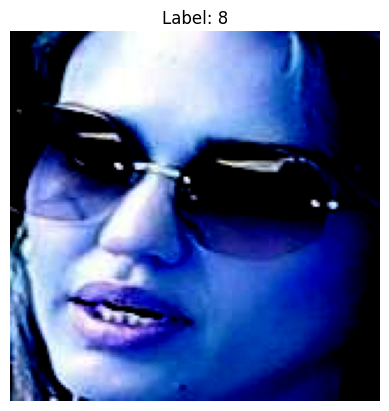

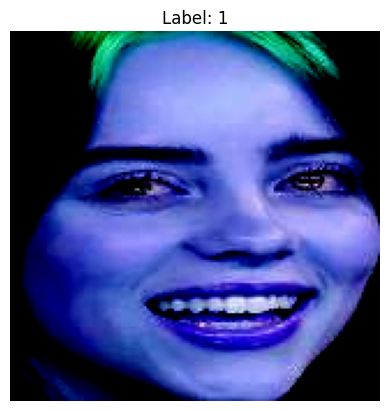

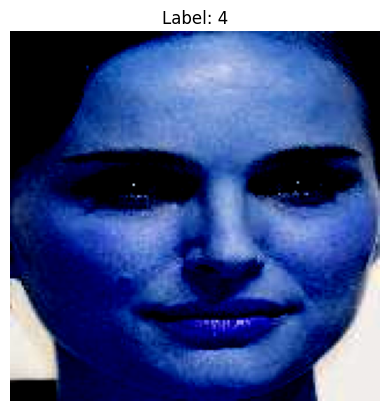

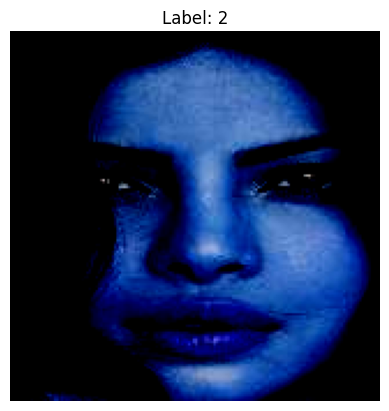

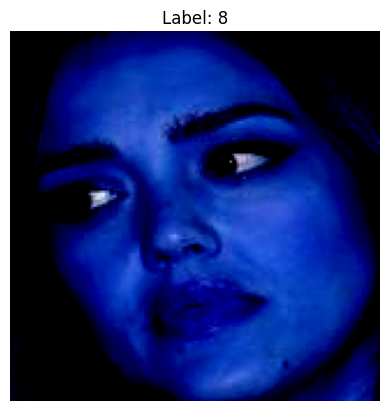

...

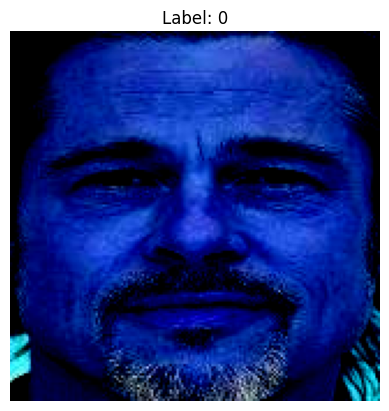

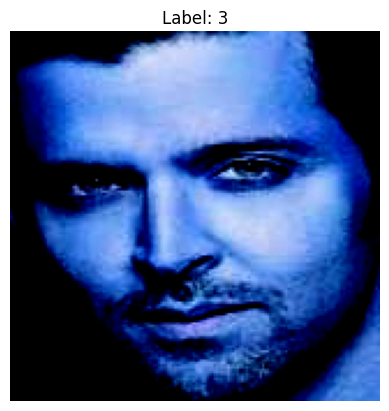

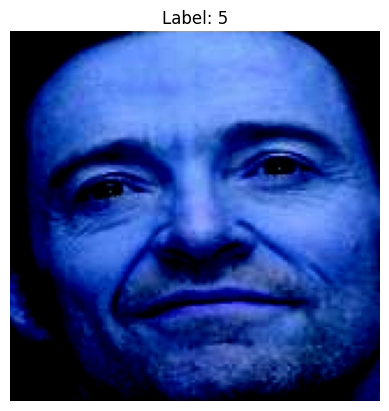

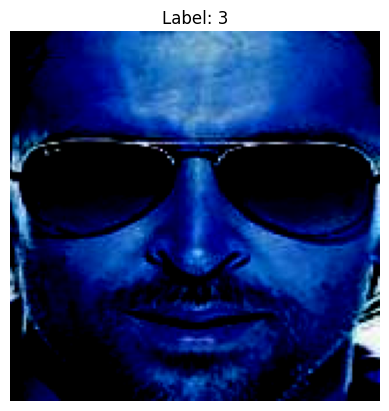

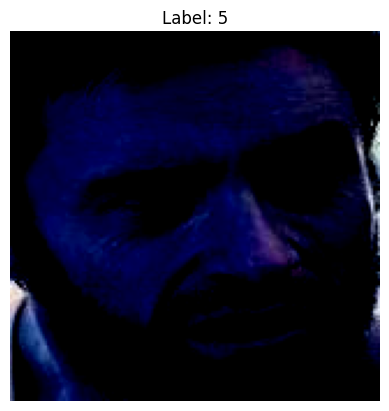

Testing:  10%|█         | 1/10 [00:07<01:11,  7.92s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


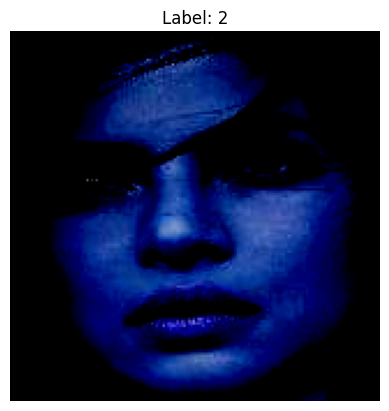

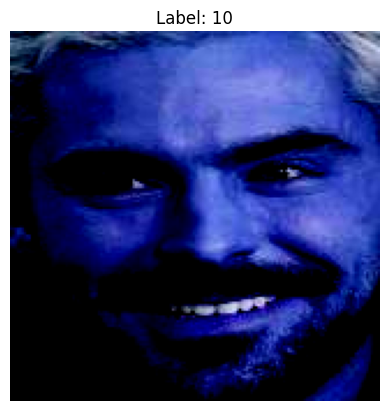

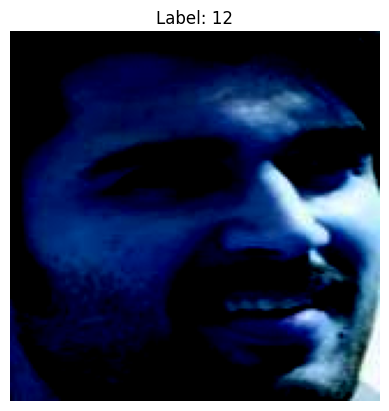

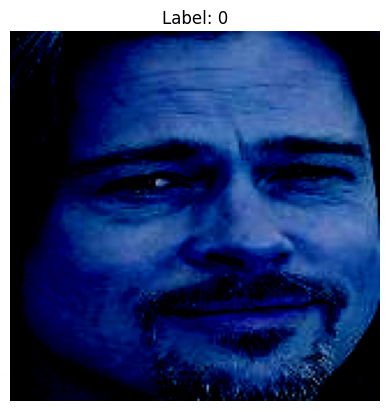

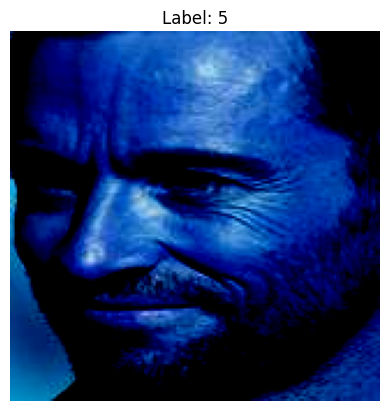

...

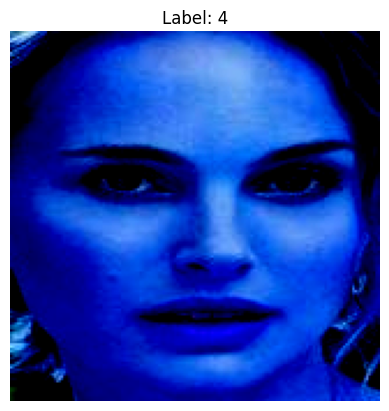

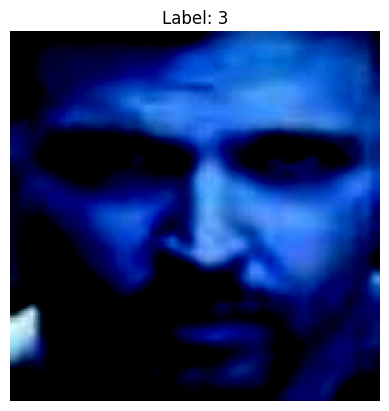

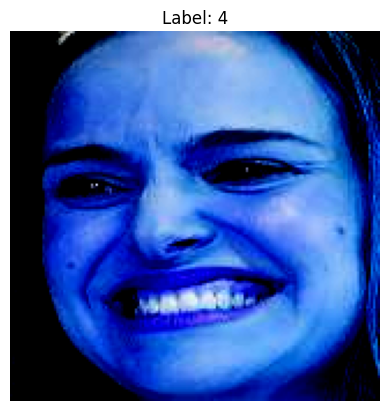

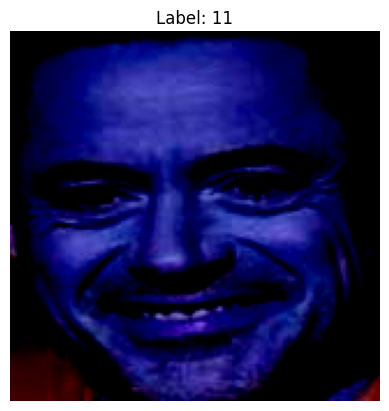

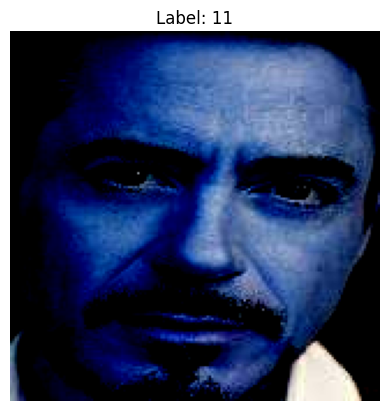

In [ ]:
# Iterate through the test loader
for images, labels in tqdm(test_loader, desc='Testing'):
    # Convert images to numpy arrays
    images_np = images.numpy()

    # Convert labels to a list of integers
    labels_list = labels.tolist()

    # Plot images with labels
    for i in range(len(images_np)):
        # Extract the image and its label
        image = images_np[i]
        label = labels_list[i]

        # Plot the image with the label as the title
        plt.imshow(np.transpose(image, (1, 2, 0)))
        plt.title(f'Label: {label}')
        plt.axis('off')
        plt.show()


# Face Verifier

# Euclidean distance Model 4

Minimum Euclidean distance: tensor(0.5344, device='cuda:0')
Label of closest image: 7
Label of random image: 7
The two images might be of the same person.


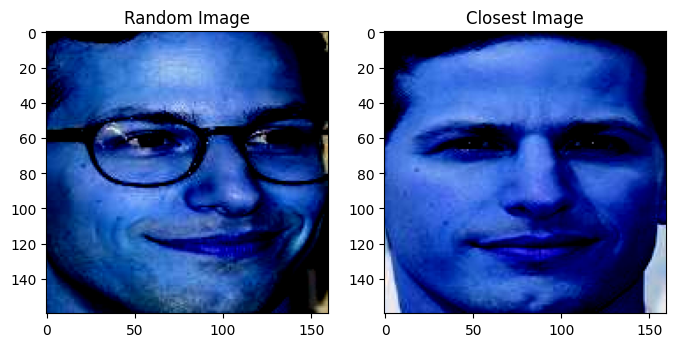

In [ ]:
import random
import matplotlib.pyplot as plt

# Set a threshold for comparison
threshold = 0.5  # You can adjust this threshold as needed

# Assuming you have already split your test data into two parts using DataLoader
# test_loader is your test DataLoader

# Determine the size of the test data to split (30% of the total test data)
test_size_part = int(0.3 * len(test_loader.dataset))

# Randomly select indices for the two parts
indices = torch.randperm(len(test_loader.dataset)).tolist()
part1_indices = indices[:test_size_part]
part2_indices = indices[test_size_part:test_size_part*2]

# Create Subset objects for the two parts
test_subset_part1 = torch.utils.data.Subset(test_loader.dataset, part1_indices)
test_subset_part2 = torch.utils.data.Subset(test_loader.dataset, part2_indices)

# Randomly select an image from the first part
random_index = random.randint(0, len(test_subset_part1) - 1)
random_image, random_label = test_subset_part1[random_index]
random_image = random_image.unsqueeze(0).to(device)  # Add batch dimension and move to device

# Get the embedding of the random image
with torch.no_grad():
    _, random_embedding = customModel_Finetune(random_image)

# Store embeddings of all images in test_subset_part2
embeddings_part2 = []

for image, label in test_subset_part2:
    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
       _, embedding = customModel_Finetune(image)
    embeddings_part2.append((embedding, label, image))

# Compare the embedding of the random image with embeddings of all images in the second part
min_distance = float('inf')
closest_embedding = None
closest_label = None
closest_image = None

for embedding, label, image in embeddings_part2:
    # Calculate the Euclidean distance between embeddings
    distance = torch.dist(random_embedding, embedding)

    # Update the closest embedding, label, and image if the distance is smaller
    if distance < min_distance:
        min_distance = distance
        closest_embedding = embedding
        closest_label = label
        closest_image = image.squeeze().cpu().numpy()  # Move image to CPU and convert to numpy array

# Print the minimum distance
print("Minimum Euclidean distance:", min_distance)

# Print the labels of the closest and random images
print("Label of closest image:", closest_label)
print("Label of random image:", random_label)

# Compare the minimum distance with the threshold
if min_distance < threshold:
    print("The two images might be of the same person.")
else:
    print("The two images are likely of different persons.")

# Plot the random image and the closest image
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(random_image.squeeze().cpu().numpy().transpose(1, 2, 0))
plt.title("Random Image")

plt.subplot(1, 2, 2)
plt.imshow(closest_image.transpose(1, 2, 0))
plt.title("Closest Image")
plt.show()


# Euclidean distance Model 2

Minimum Euclidean distance: tensor(0.8035, device='cuda:0')
Label of closest image: 13
Label of random image: 13
The two images are likely of different persons.


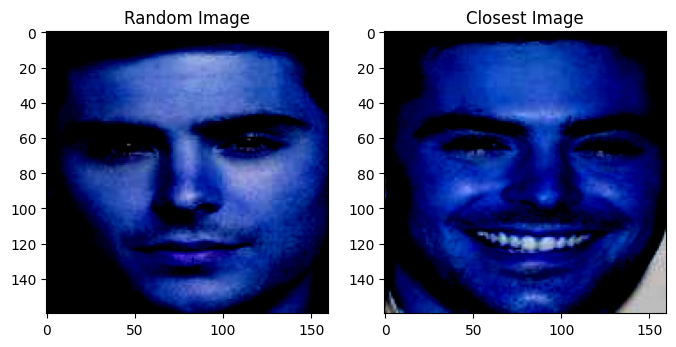

In [15]:
import random
import matplotlib.pyplot as plt

# Set a threshold for comparison
threshold = 0.5  # You can adjust this threshold as needed

# Assuming you have already split your test data into two parts using DataLoader
# test_loader is your test DataLoader

# Determine the size of the test data to split (30% of the total test data)
test_size_part = int(0.3 * len(test_loader.dataset))

# Randomly select indices for the two parts
indices = torch.randperm(len(test_loader.dataset)).tolist()
part1_indices = indices[:test_size_part]
part2_indices = indices[test_size_part:test_size_part*2]

# Create Subset objects for the two parts
test_subset_part1 = torch.utils.data.Subset(test_loader.dataset, part1_indices)
test_subset_part2 = torch.utils.data.Subset(test_loader.dataset, part2_indices)

# Randomly select an image from the first part
random_index = random.randint(0, len(test_subset_part1) - 1)
random_image, random_label = test_subset_part1[random_index]
random_image = random_image.unsqueeze(0).to(device)  # Add batch dimension and move to device

# Get the embedding of the random image
with torch.no_grad():
    _, random_embedding = custom_model1(random_image)

# Store embeddings of all images in test_subset_part2
embeddings_part2 = []

for image, label in test_subset_part2:
    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
       _, embedding = custom_model1(image)
    embeddings_part2.append((embedding, label, image))

# Compare the embedding of the random image with embeddings of all images in the second part
min_distance = float('inf')
closest_embedding = None
closest_label = None
closest_image = None

for embedding, label, image in embeddings_part2:
    # Calculate the Euclidean distance between embeddings
    distance = torch.dist(random_embedding, embedding)

    # Update the closest embedding, label, and image if the distance is smaller
    if distance < min_distance:
        min_distance = distance
        closest_embedding = embedding
        closest_label = label
        closest_image = image.squeeze().cpu().numpy()  # Move image to CPU and convert to numpy array

# Print the minimum distance
print("Minimum Euclidean distance:", min_distance)

# Print the labels of the closest and random images
print("Label of closest image:", closest_label)
print("Label of random image:", random_label)

# Compare the minimum distance with the threshold
if min_distance < threshold:
    print("The two images might be of the same person.")
else:
    print("The two images are likely of different persons.")

# Plot the random image and the closest image
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(random_image.squeeze().cpu().numpy().transpose(1, 2, 0))
plt.title("Random Image")

plt.subplot(1, 2, 2)
plt.imshow(closest_image.transpose(1, 2, 0))
plt.title("Closest Image")
plt.show()


# Cosine similarity Model 4


Maximum Cosine Similarity: 0.9449754
Label of closest image: 1
Label of random image: 1
The two images might be of the same person.


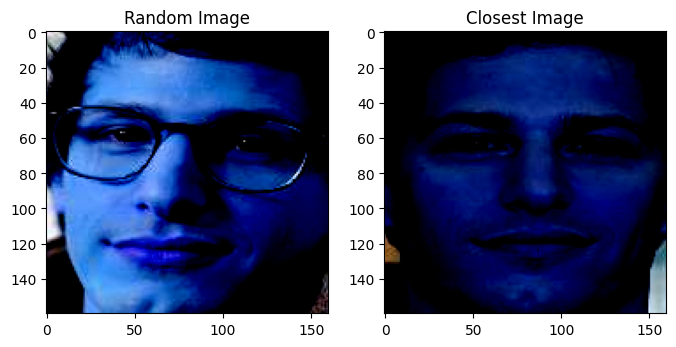

In [ ]:
import random
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

# Set a threshold for comparison
threshold = 0.7 # You can adjust this threshold as needed

# Assuming you have already split your test data into two parts using DataLoader
# test_loader is your test DataLoader

# Determine the size of the test data to split (30% of the total test data)
test_size_part = int(0.5 * len(test_loader.dataset))

# Randomly select indices for the two parts
indices = torch.randperm(len(test_loader.dataset)).tolist()
part1_indices = indices[:test_size_part]
part2_indices = indices[test_size_part:test_size_part*2]

# Create Subset objects for the two parts
test_subset_part1 = torch.utils.data.Subset(test_loader.dataset, part1_indices)
test_subset_part2 = torch.utils.data.Subset(test_loader.dataset, part2_indices)

# Randomly select an image from the first part
random_index = random.randint(0, len(test_subset_part1) - 1)
random_image, random_label = test_subset_part1[random_index]
random_image = random_image.unsqueeze(0).to(device)  # Add batch dimension and move to device

# Get the embedding of the random image
with torch.no_grad():
    _, random_embedding = customModel_Finetune(random_image)

# Store embeddings of all images in test_subset_part2
embeddings_part2 = []

for image, label in test_subset_part2:
    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
       _, embedding = customModel_Finetune(image)
    embeddings_part2.append((embedding, label, image))

# Compare the embedding of the random image with embeddings of all images in the second part
max_similarity = float('-inf')
closest_embedding = None
closest_label = None
closest_image = None

for embedding, label, image in embeddings_part2:
    # Calculate the cosine similarity between embeddings
    similarity = cosine_similarity(random_embedding.cpu().numpy(), embedding.cpu().numpy())[0][0]

    # Update the closest embedding, label, and image if the similarity is higher
    if similarity > max_similarity:
        max_similarity = similarity
        closest_embedding = embedding
        closest_label = label
        closest_image = image.squeeze().cpu().numpy()  # Move image to CPU and convert to numpy array

# Print the maximum similarity
print("Maximum Cosine Similarity:", max_similarity)

# Print the labels of the closest and random images
print("Label of closest image:", closest_label)
print("Label of random image:", random_label)

# Compare the maximum similarity with the threshold
if max_similarity > threshold:
    print("The two images might be of the same person.")
else:
    print("The two images are likely of different persons.")

# Plot the random image and the closest image
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(random_image.squeeze().cpu().numpy().transpose(1, 2, 0))
plt.title("Random Image")

plt.subplot(1, 2, 2)
plt.imshow(closest_image.transpose(1, 2, 0))
plt.title("Closest Image")
plt.show()


 # Cosine similarity Model 1

Maximum Cosine Similarity: 0.81370705
Label of closest image: 3
Label of random image: 3
The two images might be of the same person.


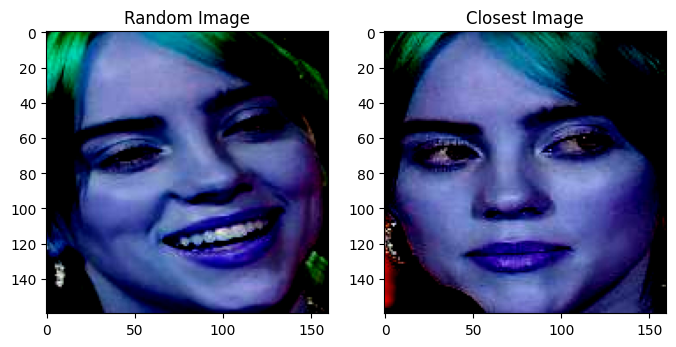

In [18]:
import random
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

# Set a threshold for comparison
threshold = 0.7 # You can adjust this threshold as needed

# Assuming you have already split your test data into two parts using DataLoader
# test_loader is your test DataLoader

# Determine the size of the test data to split (30% of the total test data)
test_size_part = int(0.5 * len(test_loader.dataset))

# Randomly select indices for the two parts
indices = torch.randperm(len(test_loader.dataset)).tolist()
part1_indices = indices[:test_size_part]
part2_indices = indices[test_size_part:test_size_part*2]

# Create Subset objects for the two parts
test_subset_part1 = torch.utils.data.Subset(test_loader.dataset, part1_indices)
test_subset_part2 = torch.utils.data.Subset(test_loader.dataset, part2_indices)

# Randomly select an image from the first part
random_index = random.randint(0, len(test_subset_part1) - 1)
random_image, random_label = test_subset_part1[random_index]
random_image = random_image.unsqueeze(0).to(device)  # Add batch dimension and move to device

# Get the embedding of the random image
with torch.no_grad():
    _, random_embedding = custom_model1(random_image)

# Store embeddings of all images in test_subset_part2
embeddings_part2 = []

for image, label in test_subset_part2:
    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
       _, embedding = custom_model1(image)
    embeddings_part2.append((embedding, label, image))

# Compare the embedding of the random image with embeddings of all images in the second part
max_similarity = float('-inf')
closest_embedding = None
closest_label = None
closest_image = None

for embedding, label, image in embeddings_part2:
    # Calculate the cosine similarity between embeddings
    similarity = cosine_similarity(random_embedding.cpu().numpy(), embedding.cpu().numpy())[0][0]

    # Update the closest embedding, label, and image if the similarity is higher
    if similarity > max_similarity:
        max_similarity = similarity
        closest_embedding = embedding
        closest_label = label
        closest_image = image.squeeze().cpu().numpy()  # Move image to CPU and convert to numpy array

# Print the maximum similarity
print("Maximum Cosine Similarity:", max_similarity)

# Print the labels of the closest and random images
print("Label of closest image:", closest_label)
print("Label of random image:", random_label)

# Compare the maximum similarity with the threshold
if max_similarity > threshold:
    print("The two images might be of the same person.")
else:
    print("The two images are likely of different persons.")

# Plot the random image and the closest image
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(random_image.squeeze().cpu().numpy().transpose(1, 2, 0))
plt.title("Random Image")

plt.subplot(1, 2, 2)
plt.imshow(closest_image.transpose(1, 2, 0))
plt.title("Closest Image")
plt.show()
